# Neural & Behavioral Modeling - Week 2 (Exercises)
by Your Name (Your Email)

In [1]:
%config IPCompleter.greedy=True 
%matplotlib inline
from numpy import *
from matplotlib.pyplot import *
import ipywidgets as widgets

## 1 Nonlinear love triangle (5 points)

Please use Euler integration with a small step size (say dt=0.01) and the suggested parameters (a,b,c,d,e,f)=(-3,4,-7,2,2,-1) to simulate Eq.(5) in the following paper:

Sprott, J. C. (2004). Dynamical models of love. Nonlinear dynamics, psychology, and life sciences, 8(3), 303-314.

### 1.1  Coding the simulation (3 points)

Please use differnt colors/shapes to put Rj(t), J, Rg(t), & G(t) curves in the same plot.

The Eq. (5) in Sprott (2004) is 
$$
\begin{align}
\frac{dR_J}{dt} &= aR_J + b(J - G)(1 - \left | J - G \right |) \\
\frac{dR_G}{dt} &= aR_G + b(G - J)(1 - \left | G - J \right |) \\
\frac{dJ}{dt} &= cR_J(1 - \left | R_J \right |) + dJ \\
\frac{dG}{dt} &= eR_G(1 - \left | R_G \right |) + fG  
\end{align}
$$

In [2]:
def triangleLove(R_J, R_G, J, G):
    a, b, c, d, e, f = -3, 4, -7, 2, 2, -1
    dt = 0.001
    t = arange(0, 20, dt)
    R_J, R_G, J, G = [R_J], [R_G], [J], [G]

    for i in t:
        R_J1, R_G1, J1, G1 = R_J[-1], R_G[-1], J[-1], G[-1]
        R_J2 = R_J1 + dt * (a * R_J1 + b * (J1 - G1) * (1 - abs(J1 - G1)))
        R_G2 = R_G1 + dt * (a * R_G1 + b * (G1 - J1) * (1 - abs(G1 - J1)))
        J2 = J1 + dt * (c * R_J1 * (1 - abs(R_J1)) + d * J1)
        G2 = G1 + dt * (e * R_G1 * (1 - abs(R_G1)) + f * G1) 
        R_J.append(R_J2)
        R_G.append(R_G2)
        J.append(J2)
        G.append(G2)

    t = t.tolist()
    t.append(t[-1]+dt)

    fig = figure(figsize = (4*4, 4*2))
    rcParams["figure.figsize"] = (4*4, 4*2)

    gs1 = GridSpec(2, 2, left = 0.02, right = 0.48)
    ax1 = fig.add_subplot(gs1[0, 0])
    ax2 = fig.add_subplot(gs1[1, 0])
    ax3 = fig.add_subplot(gs1[0, 1])
    ax1.plot(R_J, R_G); ax1.set_title("R_J"); ax1.set_ylabel("R_G")
    ax2.plot(R_J, J); ax2.set_ylabel("J")
    ax3.plot(G, R_G); ax3.set_title("G")

    gs2 = GridSpec(1, 1, left = 0.52, right = 0.98)
    ax4 = fig.add_subplot(gs2[0, 0])
    ax4.plot(t, R_J, "bv", t, R_G, "c^", t, J, "r.", t, G, "gx")
    legend(["Romeo’s love for Juliet", "Romeo’s love for Guinevere", "Juliet's love for Romeo", "Guinevere's love for Romeo"])
   
    fig.show()
    rcParams["figure.figsize"] = (6, 4)  

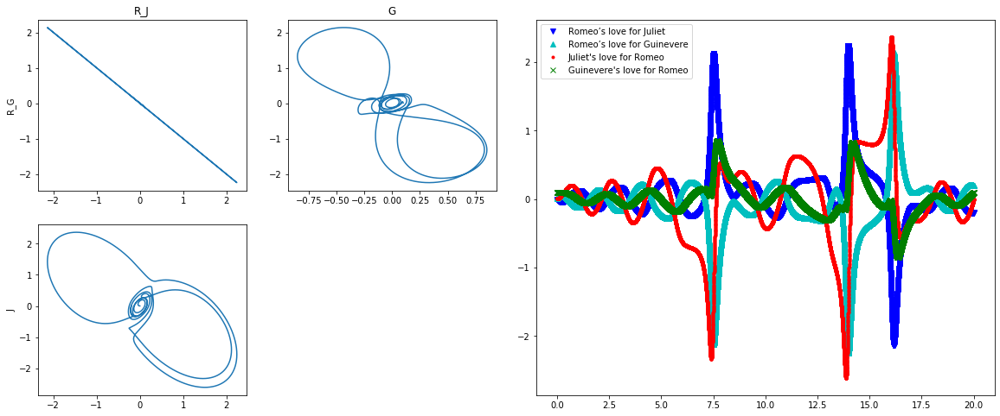

In [3]:
triangleLove(R_J = 0, R_G = 0.01, J = 0.003, G = 0.1)

經過幾次嘗試發現，如果 dt 設的不夠小，在做 Eular integration 時累績到一定程度會使得整體誤差會爆掉，因此建議 dt 比老師在題目中建議的 0.01 要在更小一些才比較好。當然，得換取更多時間來做計算。 

### 1.2 Studying chaos (2 points)

Please provide two sets of initial values of (Rj, J, Rg, & G) that can produce distinct model behaviors.

為了方便起見我寫了個動態圖表， (Rj, J, Rg, & G) 的初始值可以從下方拉桿調整數值，從 -1 到 1 範圍內，或是直接在方框後面輸入任一數值。但缺點就是，由於我將 dt 設成 0.001 因此需要等一段時間來畫圖，沒辦法很即時的呈現。

歡迎嘗試各種初始值!

In [4]:
widgets.interact(
    triangleLove,
    R_J = (-1, 1, 0.01),
    R_G = (-1, 1, 0.01), 
    G   = (-1, 1, 0.01),
    J   = (-1, 1, 0.01)
)

interactive(children=(FloatSlider(value=0.0, description='R_J', max=1.0, min=-1.0, step=0.01), FloatSlider(val…

<function __main__.triangleLove(R_J, R_G, J, G)>

## 2 Fix the simulation of "Growth and underinvestment" (5 points)

Although the simulation and explanation of "underinvested growth" seem reasonable, the simulation doesn't appear to describe "sufficiently invested growth" where the performance varialbe should be able to increase over time. Please do whatever you can to have a model that can simulate both phenomena. 

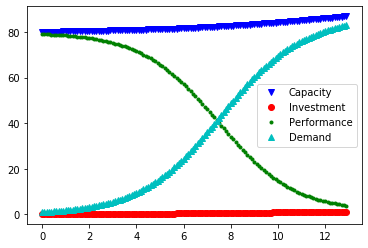

In [5]:
performance_standard=100 # Model parameter
Capacity,Demand=[80],[1] # Initial values
dt=0.1 # step size for numerical integration
t=arange(0,13,dt) # integration period
perf,inves=[],[]
for i in t:
    Capacity1,Demand1=Capacity[-1],Demand[-1] # the last element
    growing_action=0.01*Demand1
    performance=Capacity1-Demand1
    change_rate=0.75*growing_action*performance
    perf.append(performance)
    growth_and_underinvestment=performance_standard-performance
    investment=0.01*growth_and_underinvestment # !!!!!!!! Change 0.01 to 10 doesn't help !!!!!!!!
    inves.append(investment)
    Capacity2=Capacity1+dt*investment # Euler integration
    Demand2=Demand1+dt*change_rate # Euler integration
    Capacity.append(Capacity2)
    Demand.append(Demand2)
plot(t,Capacity[0:-1],'bv')
plot(t,inves,'ro')
plot(t,perf,'g.')
plot(t, Demand[0:-1], "c^")
legend(['Capacity', 'Investment', 'Performance', "Demand"]);

上圖中，我多加了一淺藍色的 Demand，較好方便觀察 Capacity、Demand 與 Performance (= Capacity - Demand) 的三者關係。


從老師的程式碼中，我們其實可以把系統動態中每個元素(存量與變項)之間的關係用數學方式寫下來，或許比較容易罹解之間個關聯。
其中，兩個最重要的存量為 Capacity 與 Demand。首先，我們先看 Capacity 隨著時間 t 的變化：

$$
\begin{align}
\frac{d}{dt}Capacity(t) &= Investment \\
&= Ic \times GrowthAndUnderinvestent \\
&= Ic \times (PerformancStandard - Performance) \\
&= Ic \times (100 - (Capacity - Demand)) \tag{1}
\end{align}
$$

其中，Ic 為調整 Investment 倍數大小的參數，可以設定的範圍從 0.01 ~ 10 (但其實可以再設更廣)。

上式說明了，如果當 Capacity 與 Demand 之間的差距越小， Capcity 的增長速率越快。由於我們初始值得設定是 $Capcity - Demand = 80 - 0 > 0$，因此在這種情況下 Capacity 會隨著時間 (疊代的進行) 一直增加。


另一方面，我們看 Demand 隨著時間 t 的變化

$$
\begin{align}
\frac{d}{dt}Demand(t) &= ChangeRate \\
&= 0.75 \times GrowingAction \times Performance \\
&= 0.75 \times (0.01 \times Demand) \times (Capacity - Demand) \tag{2}
\end{align}
$$

可以發現，Demand 的增加速率前期主要受自己本身的存量而快速增加，但這個增加速度會隨之下降，因為這邊有個上限設置，也就是 $(Capacity - Demand)$，因此當 Demand 越接近 Capcity 的時候，其增長速度會變得越來越慢，也因如此 Demand 的量在目前的設置下是不會超過 Capacity 的。整體來說，Demand 會越來越接近 Capacity，但從上方推論中知道即便 Capacity 與 Demand 差距變小，Capacity 還是會持續增長，只是兩者越當接近時，增長速率會會接近某定值。

最後，我們看項 Performance 隨著時間 t 的變化

$$
\begin{align}
Performance(t) &= Capacity(t) - Demand(t) \\
\Rightarrow \quad \frac{d}{dt}Performance(t) &= \frac{d}{dt}Capacity(t) - \frac{d}{dt}Demand(t)
\end{align}
$$

將式 (1) 與 式 (2) 分別代入上式，並整理可得

$$
\begin{align}
\frac{d}{dt}Performance(t) = 100Ic - (Ic + 0.0075 Demand) \times (Capacity - Demand) \tag{3} 
\end{align}
$$

也就是說 Performance 是遞增或遞減取決於式 (3)。然而在 $Capacity > Demand$ 之下，只要 Demand 增長到一定程度 $(Ic + 0.0075 Demand) \times (Capacity - Demand)$ 一定會超過 $100 Ic$，因此不管我們怎麼調整再多的 Investment (也就是把 $Ic$ 調得更高)，Performance 依舊還是會遞減而不會上升 ($\frac{d}{dt} Performance (t) < 0$ as t increases)。

## 改善方法
其實改進方法有很多種，但是我們最重要的目標是：

存在一個 $\varepsilon$ 使得
$$
\begin{cases}
\frac{d}{dt}Performance(t, Ic) < 0 \quad \text{ if } Ic < \varepsilon \\
\frac{d}{dt}Performance(t, Ic) \geq 0 \quad \text{ if } Ic \geq \varepsilon \
\end{cases} \tag{4}
$$

從式 (2) 與式 (1) 的觀察可以發現，其實原本設置造成 $\frac{d}{dt}Performance(t) = \frac{d}{dt}Capcity(t) - \frac{d}{dt}Demand(t)< 0$ 最主要的原因就是 Demand 的增長速率快 Capacity 太多了，導致一下子 Demand 就接近 Capacity 的量了，所以 Performance 永遠都不起色，仔細觀察發現 Demand 的增長速率是取決於 $Demand \times (Capacity - Demand)$，然而 Capacity 主要受到的是 $(Capacity - Demand)$，大致差了 Demand 倍。因此改善的方法可以從這邊下手，1. 要馬 Demand 的增長速率下降，2.或是 Capacity 的增長速率上升。下方我的作法是同時採取兩者：

1. **Demand 增長速度下降**：growing_action 乘以 $Demand$ 倍改為乘以 $\sqrt{Demand}$ 減緩增加速度；

2. **改進 growth_and_underinvestment 算法**：其中影響投資量的一個因素是 $growth_and_underinvestment = performance_standard - performance$，雖然說這個想法應該是當表現不佳時，上層會給予更多投資當作希望公司能變好，是帶有鼓勵的性質。但換句話說，當表現程度比企望落差較大時才會給比較多的投資，感覺似乎就不期待公司要表現要好，原因是當表現越差時實際能拿的投資反而會越多！因此，在這邊我想改善投資準則為 $growth_and_underinvestment = performance \times coefficient$，就是當公司表現好時，我看好你的未來 (因為將來的需求量會增加)，上層願意給予更多投資；

3. **Capacity 增長速度上升**：Capacity 增長的倍率不應該輸給 Demand，因此在改進 growth_and_underinvestment 算法中的 coefficient 也會與 $\sqrt{Demand}$ 有關，使得我們有機會滿足目標公式 (4)

最後的結果如下方 code 表示，其中以註解間格區分與原本 code 的不同地方

再搭配一些係數的調整，最後的結果如下方 code 表示，其中以註解間格區分與原本 code 的不同地方


In [6]:
def growthAndUnderinvestment(Ic):
    performance_standard=100 # Model parameter
    Capacity,Demand=[80],[1] # Initial values
    dt=0.1 # step size for numerical integration
    t=arange(0,30,dt) # integration period
    perf,inves=[],[]
    for i in t:
        Capacity1,Demand1=Capacity[-1],Demand[-1] # the last element
        #|=========
        #growing_action=0.01*Demand1
        growing_action=0.01*sqrt(Demand1)
        #=========|
        performance=Capacity1-Demand1
        change_rate=0.75*growing_action*performance
        perf.append(performance)
        #|=========
        #growth_and_underinvestment=performance_standard-performance
        growth_and_underinvestment=performance*sqrt(Demand1)*0.0075
        #=========|
        investment=Ic*growth_and_underinvestment # !!!!!!!! Change 0.01 to 10 doesn't help !!!!!!!!
        inves.append(investment)
        Capacity2=Capacity1+dt*investment # Euler integration
        Demand2=Demand1+dt*change_rate # Euler integration
        Capacity.append(Capacity2)
        Demand.append(Demand2)
    plot(t,Capacity[0:-1],'bv')
    plot(t,inves,'ro')
    plot(t,perf,'g.')
    plot(t, Demand[0:-1], "c^")
    legend(['Capacity', 'Investment', 'Performance', "Demand"]);

可以分別嘗試 $Ic < 1$ (投資不足 $\rightarrow$ 表現下降)、 $Ic = 1$ (投資堪用 $\rightarrow$ 表現穩定) 與 $Ic > 1$ (投資充分 $\rightarrow$ 表現上升) 三種場景。

In [7]:
widgets.interact(
    growthAndUnderinvestment,
    Ic = (0.01, 3, 0.01)
)

interactive(children=(FloatSlider(value=1.5, description='Ic', max=3.0, min=0.01, step=0.01), Output()), _dom_…

<function __main__.growthAndUnderinvestment(Ic)>